In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport

In [2]:
df = pd.read_csv('../Taller 2/Data_Taller_2.csv',sep = ";")

In [3]:
sns.set_theme()

In [4]:
df.head()

,instant,Date,Season,Holiday,Weather,Temp,Feel_Temp,Hum,Wind,Casual,Registered,cnt
0,1,1/01/2020,Springer,No,Mist + Cloudy,"8,175849","9,090375","0,805833","10,749882",331,654,985
1,2,2/01/2020,Springer,No,Mist + Cloudy,"9,083466","8,625733","0,696087","-16,652113",131,670,801
2,3,3/01/2020,Springer,No,Few clouds,"1,229108","0,902035","0,437273","16,636703",120,1229,1349
3,4,4/01/2020,Springer,No,Few clouds,"1,4","1,969734","0,590435","10,739832",108,1454,1562
4,5,5/01/2020,Springer,No,Partly cloudy,"2,666979","2,77569","0,436957","12,5223",82,1518,1600



### Limpieza y preparación de datos (25 pts)

Búsqueda y corrección de valores atípicos, valores faltantes y duplicados. Debido a que la base de datos no es muy grande, deberá abstenerse de eliminar registros. Así mismo, busque la oportunidad de generar nuevas variables con base en la información suministrada.


Haciendo un análisis rapido, se descubre una fecha que no existe. 2021 no es año bisiesto por lo que no existe el 29 de febrero. Se decide cambiar esta fecha a 28 de febrero.

In [5]:
df.iloc[424,1]

'29/02/2021'

In [6]:
df.iloc[424,1] = '28/02/2021'

In [7]:
df.Date = pd.to_datetime(df.Date,format="%d/%m/%Y")

Vemos también que los datos numericos están separados por comas (,) y no por punto (.) y deben ser formateados correctamente para que python los pueda leer como float

In [8]:
def formato_float(x):
     try:
          return float(x.replace(",","."))
     except:
          return

In [9]:
df[["Temp","Feel_Temp","Hum","Wind"]] = df[["Temp","Feel_Temp","Hum","Wind"]].applymap(formato_float)

In [10]:
ProfileReport(df, title="Profile Report")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Conclusiones iniciales
<ul>
<li> No hay filas duplicadas</li>
<li>Solo hay cuatro datos faltantes</li>
<li> Hay varias variables altamente correlacionadas</li>
<li> Instant es un índice por lo que debe ser eliminada</li>
<li> Holiday solo tiene 4 valores en true por lo que puede no ayudar mucho a predecir, está altamente desbalanceada </li>
</ul>

### Manejo de datos faltantes

Por la poca cantidad de datos se decide reemplazar los pocos datos faltantes con la media/moda dependiendo si es variable categorica o numérica

In [11]:
df.isna().sum()

instant       0
Date          0
Season        0
Holiday       0
Weather       0
Temp          4
Feel_Temp     0
Hum           0
Wind          0
Casual        0
Registered    0
cnt           0
dtype: int64

In [12]:
df = df.fillna(df.mean())

/var/folders/v6/hwjhxff57kz0r3_zmmhctqk00000gn/T/ipykernel_5466/114435927.py:1: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  df = df.fillna(df.mean())
/var/folders/v6/hwjhxff57kz0r3_zmmhctqk00000gn/T/ipykernel_5466/114435927.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df = df.fillna(df.mean())


In [13]:
df.isna().sum()

instant       0
Date          0
Season        0
Holiday       0
Weather       0
Temp          0
Feel_Temp     0
Hum           0
Wind          0
Casual        0
Registered    0
cnt           0
dtype: int64

In [14]:
df.corr()

,instant,Temp,Feel_Temp,Hum,Wind,Casual,Registered,cnt
instant,1.000000,0.152549,0.152638,0.018403,-0.099976,0.275255,0.659623,0.628830
Temp,0.152549,1.000000,0.987659,-0.000575,-0.143290,0.543683,0.536810,0.625056
Feel_Temp,0.152638,0.987659,1.000000,-0.021285,-0.171659,0.543864,0.544192,0.631066
Hum,0.018403,-0.000575,-0.021285,1.000000,-0.026731,-0.008490,-0.055816,-0.047965
Wind,-0.099976,-0.143290,-0.171659,-0.026731,1.000000,-0.154652,-0.197764,-0.214097
Casual,0.275255,0.543683,0.543864,-0.008490,-0.154652,1.000000,0.395282,0.672804
Registered,0.659623,0.536810,0.544192,-0.055816,-0.197764,0.395282,1.000000,0.945517
cnt,0.628830,0.625056,0.631066,-0.047965,-0.214097,0.672804,0.945517,1.000000


Como sabemos, variables altamente correlacionadas pueden llevar a problemas con el modelo de regresión. Este problema se conoce como multicolinealidad y puede llevar a que el modelo sea inestable, los coeficientes no sean interpretables y al overfitting. Por eso se decide eliminar la variable Feel_Temp ya que tiene una correlación casi perfecta con la variable Temp. La variable Registered, Casual y cnt están fuertemente correlacionadas. Esto es porque cnt es una combinación lineal de estas dos. Es por eso que para el modelo se va a intentar predecir la variable cnt pero sin hacer uso de las Variables Casual y Registered ya que esto llevaria a una predicción perfecta

#### Recategorización variable Weather

Como fue mencionado por el experto, es mejor agrupar las precipitaciones en un grupo, la neblina en otro grupo y el resto en otro. Esto nos ayudara a reducir la cardinalidad sin perder mucha información

In [15]:
df.Weather.unique()

array(['Mist + Cloudy', 'Few clouds', ' Partly    cloudy', 'Clear',
       'Mist', 'Mist + Broken clouds', ' Partly cloudy',
       'Mist + Few clouds', 'Rain + Thunderstorm',
       'Light Rain + Scattered clouds', 'Snow'], dtype=object)

In [16]:
df.Weather = df.Weather.mask(df.Weather.isin(['Mist + Cloudy', 'Mist', 'Mist + Broken clouds','Mist + Few clouds']),"neblina")

In [17]:
df.Weather.unique()

array(['neblina', 'Few clouds', ' Partly    cloudy', 'Clear',
       ' Partly cloudy', 'Rain + Thunderstorm',
       'Light Rain + Scattered clouds', 'Snow'], dtype=object)

In [18]:
df.Weather = df.Weather.mask(df.Weather.isin(['Rain + Thunderstorm','Light Rain + Scattered clouds','Snow']),"precipitacion")

In [19]:
df.Weather.unique()

array(['neblina', 'Few clouds', ' Partly    cloudy', 'Clear',
       ' Partly cloudy', 'precipitacion'], dtype=object)

In [20]:
df.Weather = df.Weather.mask(df.Weather.isin(['Few clouds', ' Partly    cloudy', 'Clear',' Partly cloudy']),"otros")

In [21]:
df.Weather.unique()

array(['neblina', 'otros', 'precipitacion'], dtype=object)

La variable Holiday es más facil de trabajar si es de tipo boolean

In [22]:
df.Holiday  = df.Holiday != "No"

La variable Date se puede desglosar en otras variables como día, mes y año

In [23]:
df["day"] = df.Date.apply(lambda x: x.day)
df["month"] = df.Date.apply(lambda x: x.month)
df["year"] = df.Date.apply(lambda x: x.year)

Se entiende por la recomendación de:

<b>Es de interés particular el comportamiento de los usuarios durante la semana.</b>

Que el modelo se quiere enfocar a días de la semana, es decir entre lunes y viernes, no los fines de semana por lo que se realiza la siguiente limpieza

In [24]:
df = df[df.Date.apply(lambda x: x.weekday() <= 5 )]

In [25]:
df.describe()

,instant,Temp,Feel_Temp,Hum,Wind,Casual,Registered,cnt,day,month,year
count,626.000000,626.000000,626.000000,626.000000,626.000000,626.000000,626.000000,626.000000,626.000000,626.000000,626.0000
mean,366.073482,15.185176,14.215740,0.691814,12.686959,893.246006,3583.573482,4476.819489,15.693291,6.531949,2020.5000
std,211.440994,8.610060,7.697786,0.809031,5.461151,713.818532,1533.824857,1934.539655,8.808279,3.452503,0.5004
min,1.000000,-5.220871,-4.283729,0.000000,-16.652113,2.000000,20.000000,22.000000,1.000000,1.000000,2020.0000
25%,183.250000,7.793950,7.641800,0.520521,9.041918,320.250000,2468.250000,3126.750000,8.000000,4.000000,2020.0000
50%,365.500000,15.268031,14.624132,0.631250,12.125057,747.500000,3567.000000,4496.500000,16.000000,7.000000,2020.5000
75%,548.750000,22.736050,20.678143,0.733750,15.625589,1200.250000,4677.750000,5932.750000,23.000000,10.000000,2021.0000
max,731.000000,32.498349,31.522112,10.867083,34.000021,3410.000000,6917.000000,8714.000000,31.000000,12.000000,2021.0000


Notamos que en la variable de viento que es una velocidad en m/s hay velocidades negativas lo que no tiene sentido en el contexto de negocio. Se reemplazara por la media.
Vemos que hay temperaturas negativas pero esto si puede pasar por lo que no se realizará ningún cambio

In [26]:
df.Wind = df.Wind.mask(df.Wind <=0, df.Wind.mean())

In [27]:
df.describe()

,instant,Temp,Feel_Temp,Hum,Wind,Casual,Registered,cnt,day,month,year
count,626.000000,626.000000,626.000000,626.000000,626.000000,626.000000,626.000000,626.000000,626.000000,626.000000,626.0000
mean,366.073482,15.185176,14.215740,0.691814,12.802516,893.246006,3583.573482,4476.819489,15.693291,6.531949,2020.5000
std,211.440994,8.610060,7.697786,0.809031,5.190283,713.818532,1533.824857,1934.539655,8.808279,3.452503,0.5004
min,1.000000,-5.220871,-4.283729,0.000000,1.500244,2.000000,20.000000,22.000000,1.000000,1.000000,2020.0000
25%,183.250000,7.793950,7.641800,0.520521,9.094597,320.250000,2468.250000,3126.750000,8.000000,4.000000,2020.0000
50%,365.500000,15.268031,14.624132,0.631250,12.187735,747.500000,3567.000000,4496.500000,16.000000,7.000000,2020.5000
75%,548.750000,22.736050,20.678143,0.733750,15.625589,1200.250000,4677.750000,5932.750000,23.000000,10.000000,2021.0000
max,731.000000,32.498349,31.522112,10.867083,34.000021,3410.000000,6917.000000,8714.000000,31.000000,12.000000,2021.0000


Busqueda de Outliers

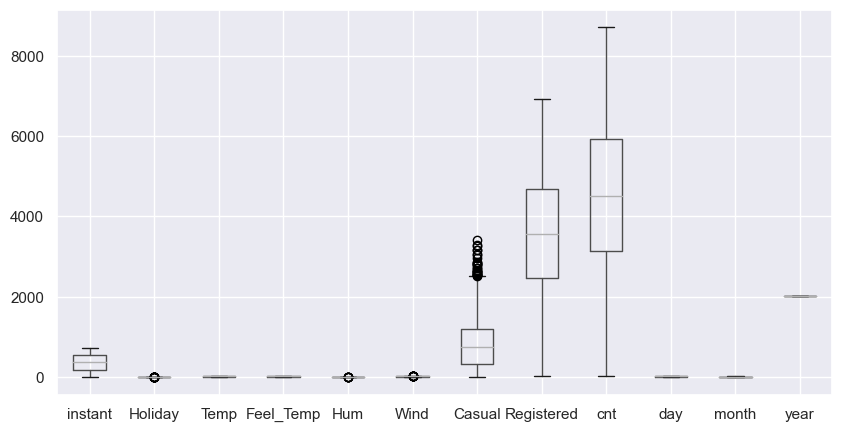

In [28]:
df.boxplot(figsize=(10,5));
plt.show()

Observamos que las variables Hum, Wind y Casual pueden contener outliers por lo que revisamos especificamente estos casos

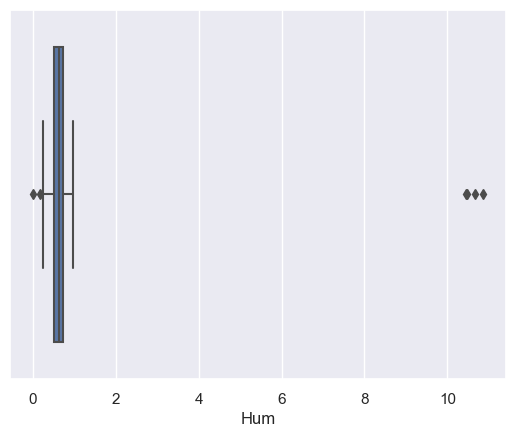

In [29]:
sns.boxplot(x=df["Hum"]);
plt.show()

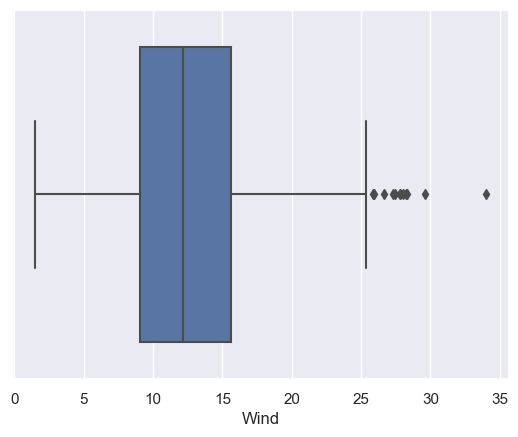

In [30]:
sns.boxplot(x=df["Wind"]);
plt.show();

Se dejaran los datos como están ya que si bien se ve que hay datos muy alejados, no se tiene suficiente conocimiento del negocio para saber si realmente pueden pasar o no.
Al utilizar modelos de regularización se puede reducir el impacto de estos outliers por lo que será una de las tecnicas a utilizar sin necesidad de modificar los datos

In [31]:
df = df.drop(["instant","Feel_Temp","Casual","Registered"],axis = 1)

In [32]:
df.head()

,Date,Season,Holiday,Weather,Temp,Hum,Wind,cnt,day,month,year
0,2020-01-01,Springer,False,neblina,8.175849,0.805833,10.749882,985,1,1,2020
1,2020-01-02,Springer,False,neblina,9.083466,0.696087,12.686959,801,2,1,2020
2,2020-01-03,Springer,False,otros,1.229108,0.437273,16.636703,1349,3,1,2020
3,2020-01-04,Springer,False,otros,1.400000,0.590435,10.739832,1562,4,1,2020
5,2020-01-06,Springer,False,otros,1.604356,0.518261,6.000868,1606,6,1,2020


### Análisis de datos (15 pts)
Analice las variables que conforman la base de datos. Realice análisis univariados y bivariados según considere. No olvide utilizar técnicas de análisis visual.

Si bien la variable Date no la vamos a utilizar en la regresión ya que fue desglosada en otros componentes, es útil para graficar la serie de tiempo

In [33]:
sns.set(rc={'figure.figsize':(10,8)})

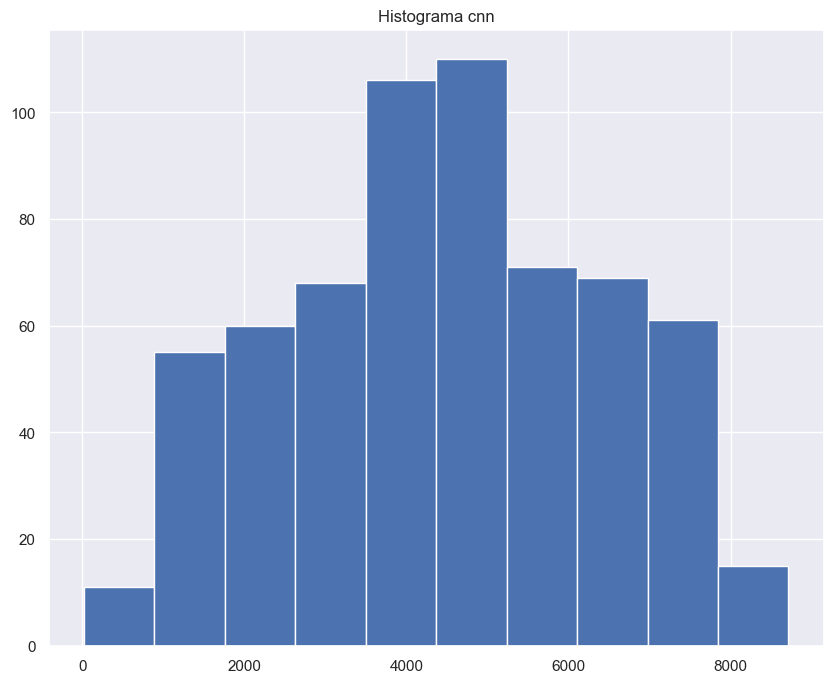

In [34]:
df.cnt.hist();
plt.title("Histograma cnn")
plt.show();

Podemos ver que pareciera que sigue una distribución normal centrada alrededor de 4000

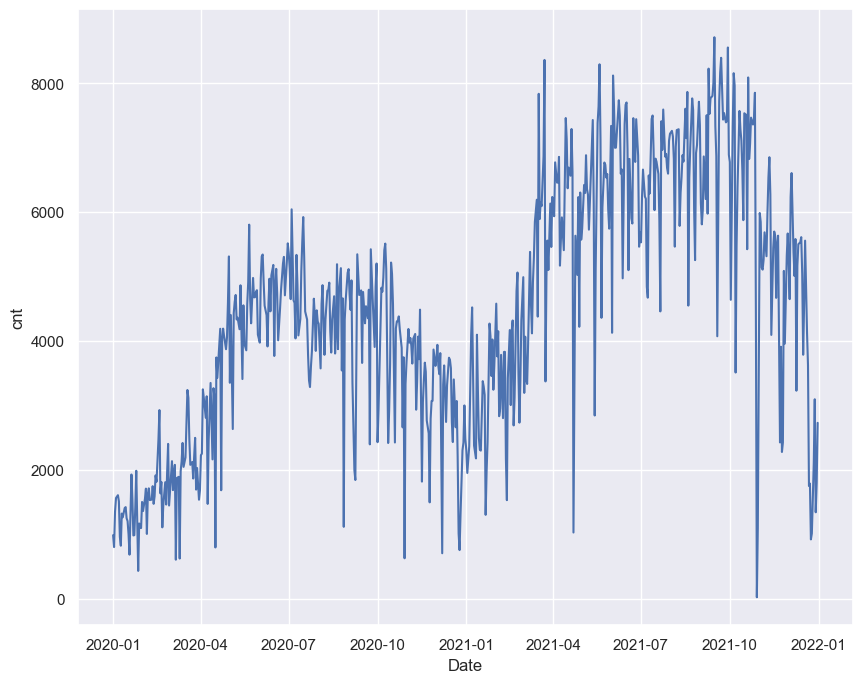

In [35]:
sns.lineplot(data=df, x="Date", y="cnt");
plt.show()


Vemos que ha medida que pasaba el tiempo ha habido una tendencia a la alza. También se alcanzan a ver componentes de "seasonality"

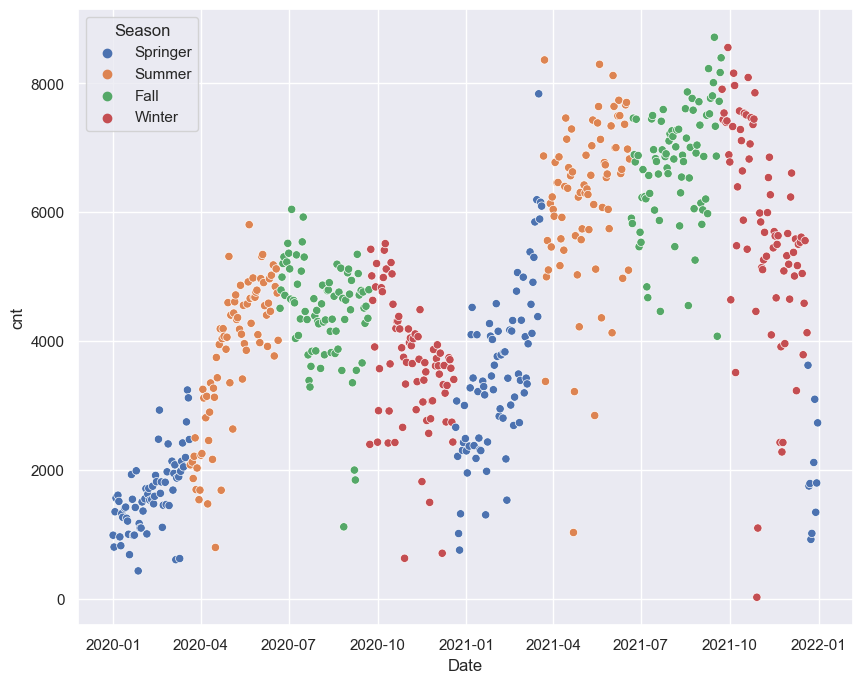

In [36]:
sns.scatterplot(data=df, x="Date", y="cnt",hue = "Season",legend = "auto");
plt.show();


### Confirmamos que efectivamente la temporada en la que estemos afecta el comportamiento de la variable objetivo

En Springer y Winter se ve que baja mucho el número de bicicletas rentadas lo que tiene sentido ya que hace mucho frio en invierno.Pasa lo contrario en summer y fall donde se ve que aumentan.

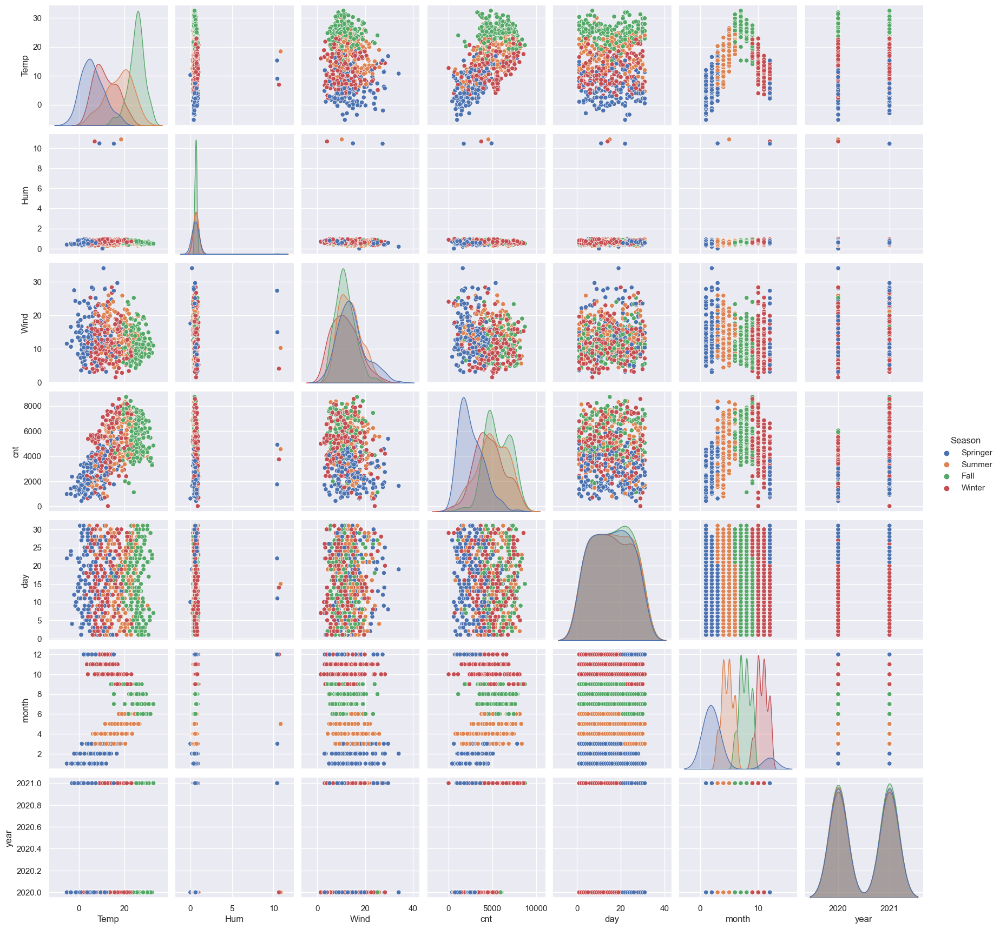

In [37]:
sns.pairplot(df.drop(["Date","Holiday","Weather"],axis = 1),hue = "Season");
plt.show();


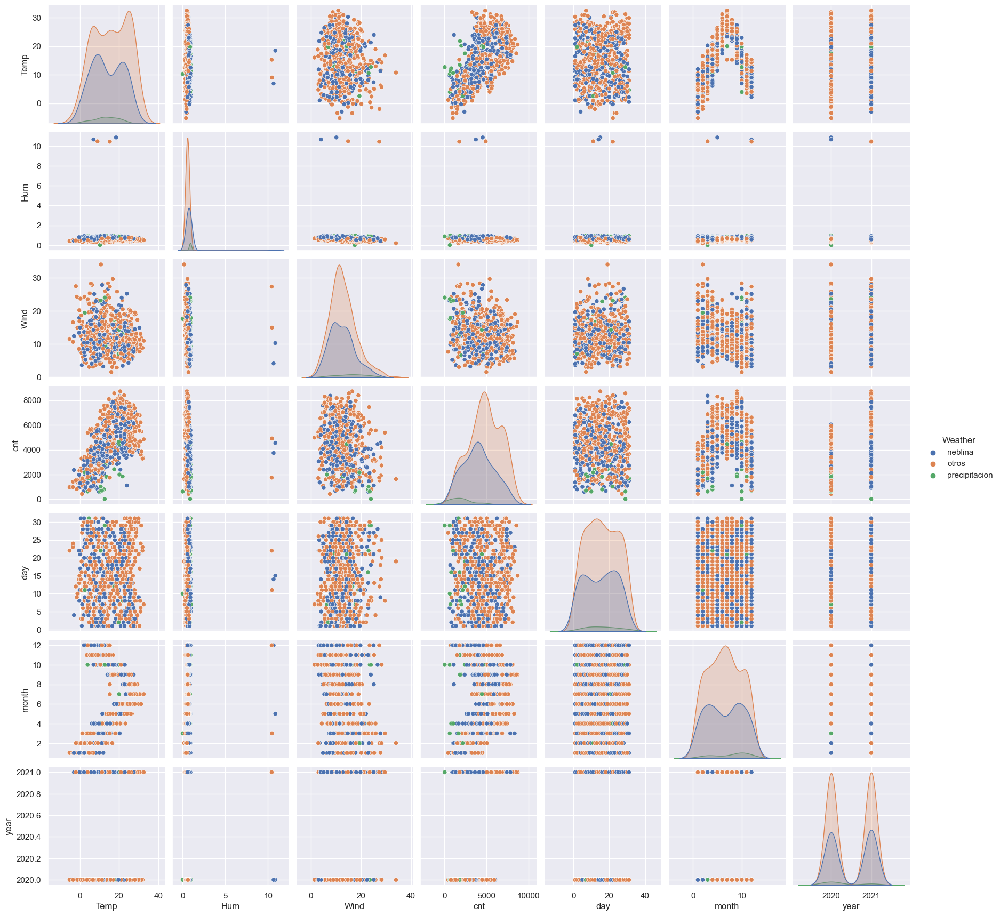

In [38]:
sns.pairplot(df.drop(["Season","Date","Holiday"],axis = 1),hue = "Weather");
plt.show();

Podemos concluir que la season influye mucho en varias variables y hace una segmentación muy buena. También la temperatura parece ser una feature muy importante ya que se relaciona con la cantidad de casuales, registrados y las bicicletas rentadas.
Por otro lado, con el weather no se ve una relación tan clara como con la season

In [39]:
df.describe()

,Temp,Hum,Wind,cnt,day,month,year
count,626.000000,626.000000,626.000000,626.000000,626.000000,626.000000,626.0000
mean,15.185176,0.691814,12.802516,4476.819489,15.693291,6.531949,2020.5000
std,8.610060,0.809031,5.190283,1934.539655,8.808279,3.452503,0.5004
min,-5.220871,0.000000,1.500244,22.000000,1.000000,1.000000,2020.0000
25%,7.793950,0.520521,9.094597,3126.750000,8.000000,4.000000,2020.0000
50%,15.268031,0.631250,12.187735,4496.500000,16.000000,7.000000,2020.5000
75%,22.736050,0.733750,15.625589,5932.750000,23.000000,10.000000,2021.0000
max,32.498349,10.867083,34.000021,8714.000000,31.000000,12.000000,2021.0000


In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 626 entries, 0 to 730
Data columns (total 11 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Date     626 non-null    datetime64[ns]
 1   Season   626 non-null    object        
 2   Holiday  626 non-null    bool          
 3   Weather  626 non-null    object        
 4   Temp     626 non-null    float64       
 5   Hum      626 non-null    float64       
 6   Wind     626 non-null    float64       
 7   cnt      626 non-null    int64         
 8   day      626 non-null    int64         
 9   month    626 non-null    int64         
 10  year     626 non-null    int64         
dtypes: bool(1), datetime64[ns](1), float64(3), int64(4), object(2)
memory usage: 70.6+ KB


In [41]:
df.drop("Date",axis = 1, inplace = True)

### Desarrollo de modelos de regresión (30 pts)
Implemente al menos 3 modelos basados en el algoritmo de regresión lineal: uno simple, uno polinomial y uno con algún tipo de regularización.

In [42]:
X = df.drop("cnt",axis = 1)
y = df.cnt

In [43]:
X = pd.get_dummies(X)

In [44]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=75)

* Regresión lineal simple

In [45]:
from sklearn.linear_model import LinearRegression

reg = LinearRegression()
reg.fit(X_train, y_train)

LinearRegression()

In [46]:
from sklearn.metrics import mean_squared_error

y_pred = reg.predict(X_test)
mean_squared_error(y_test, y_pred,squared = False)

941.0051903927655

In [47]:
from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(y_test, y_pred)

0.21080900559976773

* Modelo polinomial

In [48]:
from sklearn.preprocessing import PolynomialFeatures

poly_features = PolynomialFeatures(degree = 2, include_bias = False)
poly_features.fit(X_train)
numeric_poly = poly_features.transform(X_train)
reg_poly = LinearRegression()
reg_poly.fit(numeric_poly, y_train)

LinearRegression()

In [49]:
X_test_poly = poly_features.transform(X_test)
y_pred = reg_poly.predict(X_test_poly)
mean_squared_error(y_test, y_pred,squared = False)

7437.755258571272

In [50]:
from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(y_test, y_pred)

0.39113284855059544

*Modelo de Regularización (Ridge)

In [51]:
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler

#Escalar las variables
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
ridge = Ridge(alpha = 0.1, solver = "cholesky")
ridge.fit(X_train_scaled,y_train)

Ridge(alpha=0.1, solver='cholesky')

In [52]:
X_test_scaled = scaler.transform(X_test)
y_pred = ridge.predict(X_test_scaled)
mean_squared_error(y_test, y_pred,squared = False)

940.9637456547013

In [53]:
mean_absolute_percentage_error(y_test, y_pred)

0.21079451047594486

La diferencia entre la regresión simple y el modelo de Ridge es muy baja. Si bien, Ridge da ligeramente mejor no es una diferencia significativa por lo que se podría utilizar cualquiera de los dos modelos. Por otro lado, el modelo polinomial da un desempeño mucho más bajo por lo que si es descartado

Al ser un proceso iterativo, vamos a probar una limpieza de los outliers para ver si podemos mejorar el desempeño del modelo.
Recordando que las variables humidity y wind tienen algunos valores atipicos los vamos a reemplazar por la media.

In [54]:
df_nuevo = df.copy()

Los valores criticos se tomaron del boxplot de arriba
Se decide reemplazarlos por la media ya que borrarlos no era una opción viable por la poca cantidad de datos disponibles

In [55]:
df_nuevo["Hum"] = df_nuevo["Hum"].mask(df_nuevo["Hum"] > 4,df_nuevo["Hum"].mean())

In [56]:
df_nuevo["Wind"] = df_nuevo["Wind"].mask(df_nuevo["Wind"] > 25,df_nuevo["Wind"].mean())

In [57]:
X = df_nuevo.drop("cnt",axis = 1)
y = df_nuevo.cnt

In [58]:
X = pd.get_dummies(X)

In [59]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=75)

* Regresión lineal simple

In [60]:
from sklearn.linear_model import LinearRegression

reg = LinearRegression()
reg.fit(X_train, y_train)

LinearRegression()

In [61]:
from sklearn.metrics import mean_squared_error

y_pred = reg.predict(X_test)
mean_squared_error(y_test, y_pred,squared = False)

929.5246090042899

In [62]:
from sklearn.metrics import mean_absolute_percentage_error

mean_absolute_percentage_error(y_test, y_pred)

0.19901744866230192

El modelo mejoro un poco por lo que los outliers si estaban afectando el desempeño.

### Interpretación (10 pts)
El día de la presentación de resultados, una persona de la alcaldía le hace las siguientes preguntas:

* ¿Cuáles son las 3 variables más importantes para la predicción de la cantidad de usuarios?

In [63]:
pd.DataFrame(reg.coef_,reg.feature_names_in_,columns = ["Coeficientes"]).sort_values("Coeficientes",ascending = False)

,Coeficientes
year,1907.347751
Weather_otros,873.376652
Season_Winter,778.363491
Weather_neblina,438.637241
Season_Summer,265.029795
Temp,113.686084
day,-8.729820
month,-30.365986
Wind,-35.459321
Season_Fall,-68.787296


Si bien podemos pensar que entre más grande el valor absoluto del coeficiente, más importante es, este acercamiento no es cierto para este caso. Las variables al no estar escaladas no son un indicio correcto de la importancia de las variables porque precisamente el coeficiente es dependiente de la escala. Es por esto que vamos a escalar las variables y realizar la regresión nuevamente.

In [64]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

reg = LinearRegression()
reg.fit(X_train_scaled, y_train)

X_test_scaled = scaler.transform(X_test)

y_pred = reg.predict(X_test_scaled)
mean_squared_error(y_test, y_pred,squared = False)

930.1591313025132

In [65]:
mean_absolute_percentage_error(y_test, y_pred)

0.1974112146207213

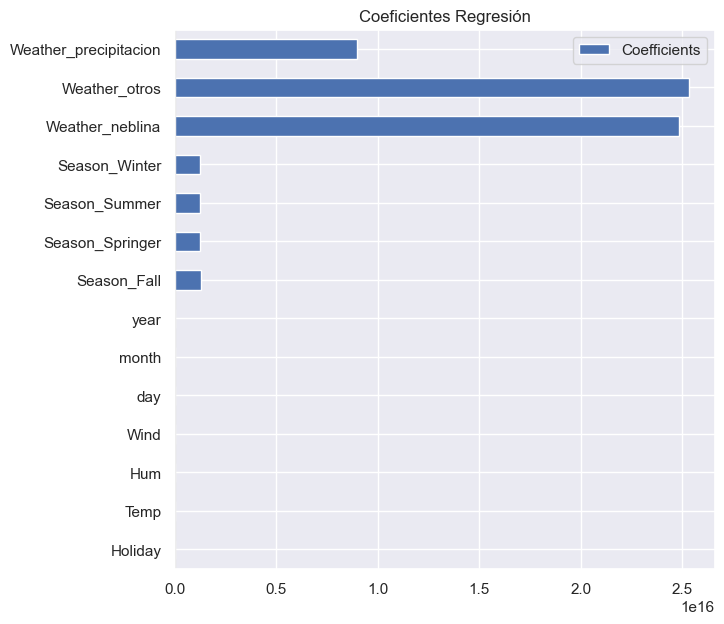

In [66]:
coefs = pd.DataFrame(
   reg.coef_,
   columns=['Coefficients'], index=X_train.columns
)

coefs.plot(kind='barh', figsize=(9, 7))
plt.title('Coeficientes Regresión')
plt.axvline(x=0, color='.5')
plt.subplots_adjust(left=.3)
plt.show()

In [67]:
coefs.sort_values("Coefficients",ascending = False)

,Coefficients
Weather_otros,2.533090e+16
Weather_neblina,2.482237e+16
Weather_precipitacion,8.991507e+15
Season_Fall,1.275063e+15
Season_Springer,1.256114e+15
Season_Winter,1.232410e+15
Season_Summer,1.232410e+15
Temp,9.850814e+02
year,9.601267e+02
day,-7.482252e+01


Si bien los coeficientes no son interpretables por que las variables están escaladas de ahí podemos obtener que las variables más importantes son:

* El clima
* La temporada

Siendo que el clima de "otros" es el que más influye seguido de la neblina y  precipitación.


* Describa cual es el escenario ideal para el incremento de usuarios.

El escenario ideal es cuando el clima es "otros" que incluye:

* Few clouds
* Partly cloudy
* Clear
* Partly cloudy

Es decir, cuando no está lloviendo ni con neblina.

La mejor temporada es Fall.

### ¿Qué pasos adicionales deberían tener en cuenta para una próxima iteración/mejora del modelo?

Se deben recopilar más datos, el modelo actual fue entrenado con muy pocos datos y no sabemos que tan bien generalizara datos que todavía no ha visto.
Adicional a esto, tener contacto con el experto para entender si esos valores anomalos pueden ser reales o no son posibles por el contexto.
Por último, se deberian probar modelos un poco más complejos para ver si se puede mejorar el desempeño actual